# Leveraging Python for Spatial Data Science

[CARTO Spatial Data Science Bootcamp NYC](https://spatial-data-science-conference.com/bootcamps/2023/) | March 23rd, 2023

Instructor: [Will Geary](https://www.linkedin.com/in/willgeary/), Senior Data Scientist at [Revel Transit](https://gorevel.com/)

In this workshop, we will perform spatial analysis on ridehail trips in NYC. We will cover the following:

    1) Perfom some necessary cleaning on the data
    2) Illustrate the Modifiable Areal Unit Problem (MAUP) and why we can't simply analyze the count of pickups per zone
    3) Calculate pickup density per zone
    4) Make some simple choropleth maps
    5) Perform a statistical Cluster and Outlier analysis. This requires a few steps:
        a) Create a Spatial Weights matrix
        b) Introduce the concept of spatial autocorrelation
        c) Introduce the Local Moran's I statistic (a local measurement of spatial autocorrelation)
        d) Detect statistically significant clusters (hotspots & coldspots) and outliers (diamonds & doughnuts)

In [1]:
from IPython.display import Image
Image(url= "https://i.imgur.com/9lD04Ie.png")

Source: [Todd Schneider](https://toddwschneider.com/dashboards/nyc-taxi-ridehailing-uber-lyft-data/)

## Import libraries

In [2]:
import pandas as pd
import geopandas as gpd
import contextily as ctx
import seaborn as sns
import matplotlib.pyplot as plt
from shapely.geometry import Point
import random

# PySAL libraries
import libpysal
import esda
from splot import esda as esdaplot

## Read in the Trips Data

We will focus on the High-Volume For Hire Vehicle Trips which, as of March 2023, includes Uber & Lyft trips. Each row is a trip and is spatially aggregated by Taxi Zone.

`PULocationID` is the unique identifier of the pickup Taxi Zone.

`DOLocationID` is the unique identifier of the dropoff Taxi Zone.

Source: [TLC Trip Record Data](https://www.nyc.gov/site/tlc/about/tlc-trip-record-data.page), NYC Taxi & Limousine Commission

In [3]:
url = "https://d37ci6vzurychx.cloudfront.net/trip-data/fhvhv_tripdata_2022-11.parquet" # latest availble month is November 2022

The trip records are stored as parquet files. We can read them with Pandas, but need to have `pyarrow` installed. 

This should take about a minute.

In [4]:
%%time
trips = pd.read_parquet(url)

CPU times: user 23.4 s, sys: 29.6 s, total: 53 s
Wall time: 59.9 s


In [5]:
trips.head()

,hvfhs_license_num,dispatching_base_num,originating_base_num,request_datetime,on_scene_datetime,pickup_datetime,dropoff_datetime,PULocationID,DOLocationID,trip_miles,...,sales_tax,congestion_surcharge,airport_fee,tips,driver_pay,shared_request_flag,shared_match_flag,access_a_ride_flag,wav_request_flag,wav_match_flag
0,HV0003,B03404,B03404,2022-11-01 00:04:09,2022-11-01 00:10:11,2022-11-01 00:10:31,2022-11-01 00:17:28,61,61,1.040,...,0.70,0.00,0.0,0.0,5.40,N,N,,N,N
1,HV0003,B03404,B03404,2022-11-01 00:42:26,2022-11-01 00:45:33,2022-11-01 00:46:33,2022-11-01 00:58:18,209,79,2.070,...,1.29,2.75,0.0,0.0,11.13,N,N,,N,N
2,HV0003,B03404,B03404,2022-11-01 00:11:53,2022-11-01 00:17:15,2022-11-01 00:19:16,2022-11-01 00:46:19,181,170,8.270,...,2.43,2.75,0.0,0.0,24.14,N,N,,N,N
3,HV0003,B03404,B03404,2022-11-01 00:45:30,2022-11-01 00:49:39,2022-11-01 00:50:18,2022-11-01 01:08:10,107,80,5.020,...,2.37,2.75,0.0,0.0,17.00,N,N,,N,N
4,HV0005,B03406,None,2022-10-31 23:56:33,NaT,2022-11-01 00:01:41,2022-11-01 00:20:33,41,241,6.322,...,1.98,0.00,0.0,0.0,17.40,N,N,N,N,N


In [6]:
trips.dtypes

hvfhs_license_num               object
dispatching_base_num            object
originating_base_num            object
request_datetime        datetime64[ns]
on_scene_datetime       datetime64[ns]
pickup_datetime         datetime64[ns]
dropoff_datetime        datetime64[ns]
PULocationID                     int64
DOLocationID                     int64
trip_miles                     float64
trip_time                        int64
base_passenger_fare            float64
tolls                          float64
bcf                            float64
sales_tax                      float64
congestion_surcharge           float64
airport_fee                    float64
tips                           float64
driver_pay                     float64
shared_request_flag             object
shared_match_flag               object
access_a_ride_flag              object
wav_request_flag                object
wav_match_flag                  object
dtype: object

## Read in the Taxi Zones

Source: [NYC Taxi Zones](https://data.cityofnewyork.us/Transportation/NYC-Taxi-Zones/d3c5-ddgc), NYC Open Data

In [7]:
url = "https://data.cityofnewyork.us/api/geospatial/d3c5-ddgc?method=export&format=GeoJSON"

In [8]:
zones = gpd.read_file(url)

Select only the columns we need for this exercise.

In [9]:
zones = zones[['location_id', 'zone', 'borough', 'geometry']]

In [10]:
zones.head()

,location_id,zone,borough,geometry
0,1,Newark Airport,EWR,"MULTIPOLYGON (((-74.18445 40.69500, -74.18449 ..."
1,2,Jamaica Bay,Queens,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ..."
2,3,Allerton/Pelham Gardens,Bronx,"MULTIPOLYGON (((-73.84793 40.87134, -73.84725 ..."
3,4,Alphabet City,Manhattan,"MULTIPOLYGON (((-73.97177 40.72582, -73.97179 ..."
4,5,Arden Heights,Staten Island,"MULTIPOLYGON (((-74.17422 40.56257, -74.17349 ..."


In [11]:
zones.dtypes

location_id      object
zone             object
borough          object
geometry       geometry
dtype: object

## Clean the Taxi Zones

The PULocationID and DOLocationID in trips are integers, so convert location_id to be integer as well.

In [12]:
zones['location_id'] = zones['location_id'].astype(int)

View the zones.

In [13]:
zones.explore(tiles='CartoDB positron')

Check to make sure all of the Location ID's are unique to each polygon. Since we will be joining trip counts to each zone geometry, we need the zone IDs to be unique (otherwise we would be double counting trips).

In [14]:
zones['location_id'].value_counts()

103    3
56     2
1      1
175    1
181    1
      ..
93     1
94     1
95     1
96     1
262    1
Name: location_id, Length: 260, dtype: int64

Uh oh! It looks like some of the Location ID's are non-unique, and we have some shapes with duplicate ID's.

Let's explore Location ID `103`.

In [15]:
zones.query("location_id == 103")

,location_id,zone,borough,geometry
103,103,Governor's Island/Ellis Island/Liberty Island,Manhattan,"MULTIPOLYGON (((-74.04389 40.69018, -74.04351 ..."
104,103,Governor's Island/Ellis Island/Liberty Island,Manhattan,"MULTIPOLYGON (((-74.03995 40.70089, -74.03945 ..."
105,103,Governor's Island/Ellis Island/Liberty Island,Manhattan,"MULTIPOLYGON (((-74.01675 40.69334, -74.01540 ..."


In [16]:
zones.query("location_id == 103").explore(tiles='CartoDB positron')

Let's explore Location ID `56`.

In [17]:
zones.query("location_id == 56")

,location_id,zone,borough,geometry
55,56,Corona,Queens,"MULTIPOLYGON (((-73.85361 40.74750, -73.85325 ..."
56,56,Corona,Queens,"MULTIPOLYGON (((-73.85131 40.74984, -73.85443 ..."


In [18]:
zones.query("location_id == 56").explore(tiles='CartoDB positron')

We can fix this problem by using `dissolve()` on the Location IDs. The result will be one MultiPolygon per Location ID, rather than multiple Polygons per Location ID.

In [19]:
zones = zones.dissolve('location_id').reset_index()

Now our Location ID's are unique.

In [20]:
zones['location_id'].value_counts()

1      1
167    1
169    1
170    1
171    1
      ..
93     1
94     1
95     1
96     1
263    1
Name: location_id, Length: 260, dtype: int64

In [21]:
zones.query("location_id == 103")

,location_id,geometry,zone,borough
101,103,"MULTIPOLYGON (((-74.01540 40.69307, -74.01535 ...",Governor's Island/Ellis Island/Liberty Island,Manhattan


In [22]:
zones.query("location_id == 103").explore(tiles='CartoDB positron')

In [23]:
zones.query("location_id == 56")

,location_id,geometry,zone,borough
55,56,"MULTIPOLYGON (((-73.85325 40.74682, -73.85292 ...",Corona,Queens


In [24]:
zones.query("location_id == 56").explore(tiles='CartoDB positron')

## Count Pickups per Zone

Now that we have a clean set of Taxi Zones to work with, let's investigate which ones have the highest and lowest demand.

First, let's count the total number of pickups in each zone for the entire month.

In [25]:
pickups_per_zone = trips['PULocationID'].value_counts()

In [26]:
pickups_per_zone.head()

138    355958
132    320975
79     257788
161    252480
230    252066
Name: PULocationID, dtype: int64

Let's convert this to average daily pickups by dividing by the number of days in November (30).

In [27]:
avg_daily_pickups_per_zone = pickups_per_zone / 30

In [28]:
avg_daily_pickups_per_zone.head()

138    11865.266667
132    10699.166667
79      8592.933333
161     8416.000000
230     8402.200000
Name: PULocationID, dtype: float64

Convert this into a DataFrame and give it a proper column name.

In [29]:
avg_daily_pickups_per_zone = pd.DataFrame(avg_daily_pickups_per_zone)
avg_daily_pickups_per_zone.columns = ['avg_daily_pickups']

In [30]:
avg_daily_pickups_per_zone.head()

,avg_daily_pickups
138,11865.266667
132,10699.166667
79,8592.933333
161,8416.000000
230,8402.200000


## Merge Average Daily Pickups to Taxi Zones

In [31]:
zones = pd.merge(zones, avg_daily_pickups_per_zone, how='left', left_on='location_id', right_index=True)

Are there any Null values?

In [32]:
zones[pd.isnull(zones).any(axis=1)]

,location_id,geometry,zone,borough,avg_daily_pickups
101,103,"MULTIPOLYGON (((-74.01540 40.69307, -74.01535 ...",Governor's Island/Ellis Island/Liberty Island,Manhattan,NaN


It looks like there is one zone with a Null value for averge daily pickups. This makes sense, as you can't visit Governor's Island by car.

Drop the row with null values.

In [33]:
zones = zones.dropna(subset=['avg_daily_pickups']).reset_index(drop=True)

## Map the Zones by # of Avg Daily Pickups

First, let's make a simple map plotting the number of daily pickups by Taxi Zone.

(As we will see shortly, this is a *BAD* and misleading way to map the data!)

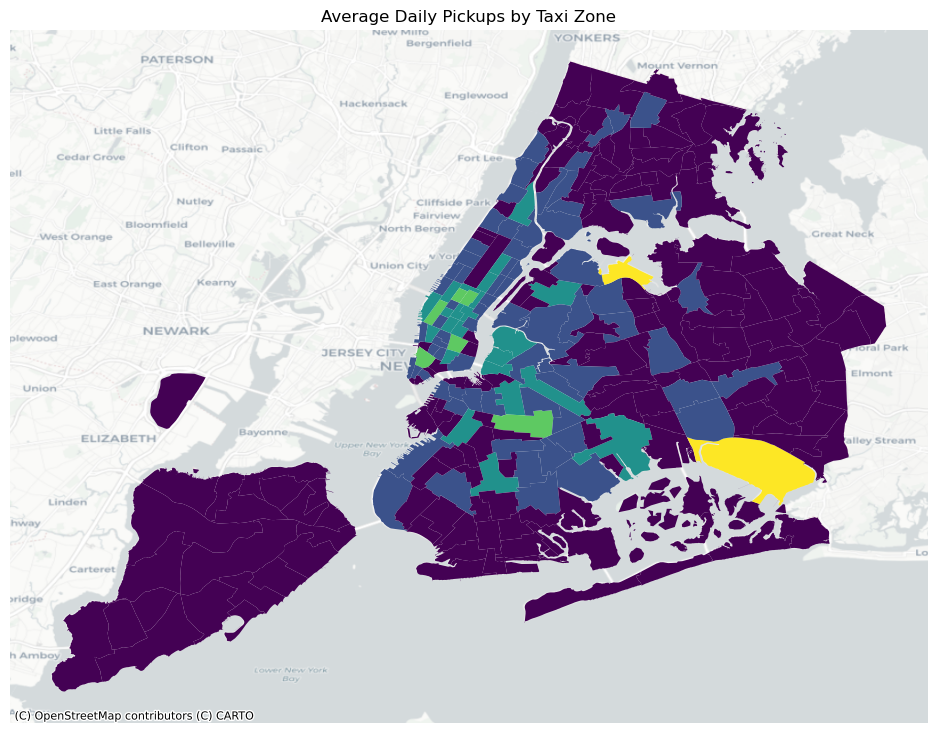

In [34]:
ax = zones.plot(column='avg_daily_pickups', figsize=(12, 9), scheme='equal_interval')
ctx.add_basemap(ax, crs=zones.crs.to_string(), source=ctx.providers.CartoDB.Positron)
ax.set_title("Average Daily Pickups by Taxi Zone")
ax.axis('off');

## Modifiable Areal Unit Problem

The below is from Chapter 5 of Manuel Gimond's [Intro to GIS and Spatial Analysis](https://mgimond.github.io/Spatial/index.html). It is a fantastic resource.

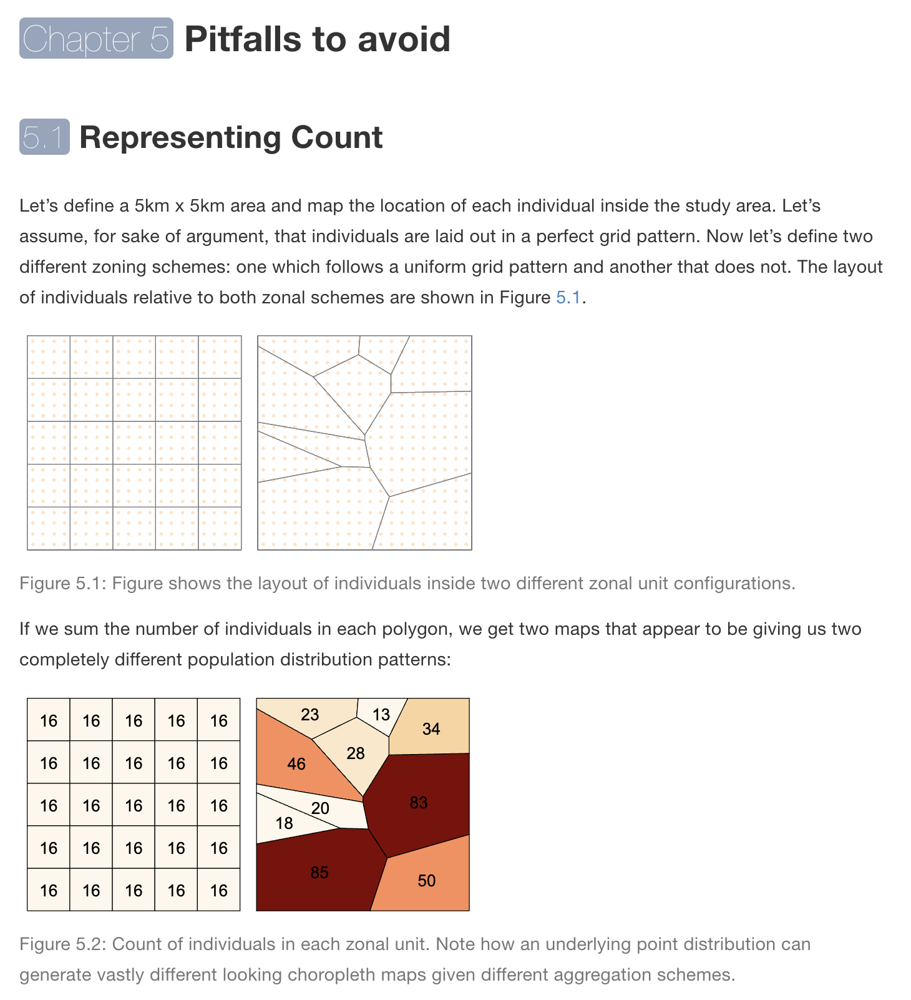

In [35]:
Image("https://i.imgur.com/qKTJfVY.png", width=800)

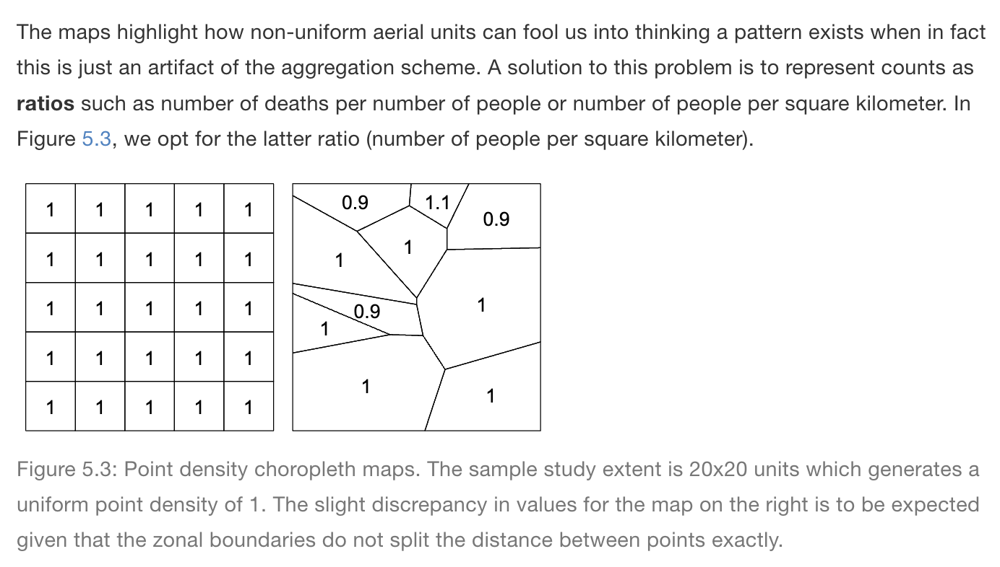

In [36]:
Image("https://i.imgur.com/tZBc1Kg.png", width=800)

## Illustrating MAUP with Our Data

With our Pickups per Zone map, we are running into the modifiable areal unit problem because we are counting points by areal units of varying size and shape. The problem is that bigger Taxi Zones will be biased upwards (contining more pickups) and smaller Taxi Zones will be biased downwards (containing fewer pickups). 

In order to demonstrate how the Modifiable Areal Unit Problem affects our data, let's simulate points for a sample of pickups and visualize them with a heatmap.

In [37]:
def random_points_in_polygon(number, polygon):
    # Source: https://gis.stackexchange.com/questions/294394/randomly-sample-from-geopandas-dataframe-in-python
    points = []
    min_x, min_y, max_x, max_y = polygon.bounds
    i= 0
    while i < number:
        point = Point(random.uniform(min_x, max_x), random.uniform(min_y, max_y))
        if polygon.contains(point):
            points.append(point)
            i += 1
    return points

In [38]:
pickup_points = []
for i, row in zones.iterrows():
    num = round(row['avg_daily_pickups'] * 0.10) # only simulate 10% of the points to save time
    polygon = row['geometry']
    points = random_points_in_polygon(num, polygon)
    pickup_points.extend(points)

In [39]:
pickup_points_gdf = gpd.GeoDataFrame(geometry=pickup_points, crs=4326)

Now lets plot the points. Notice how it looks quite different from the previous map? Manhattan stands out more as a high demand zone.

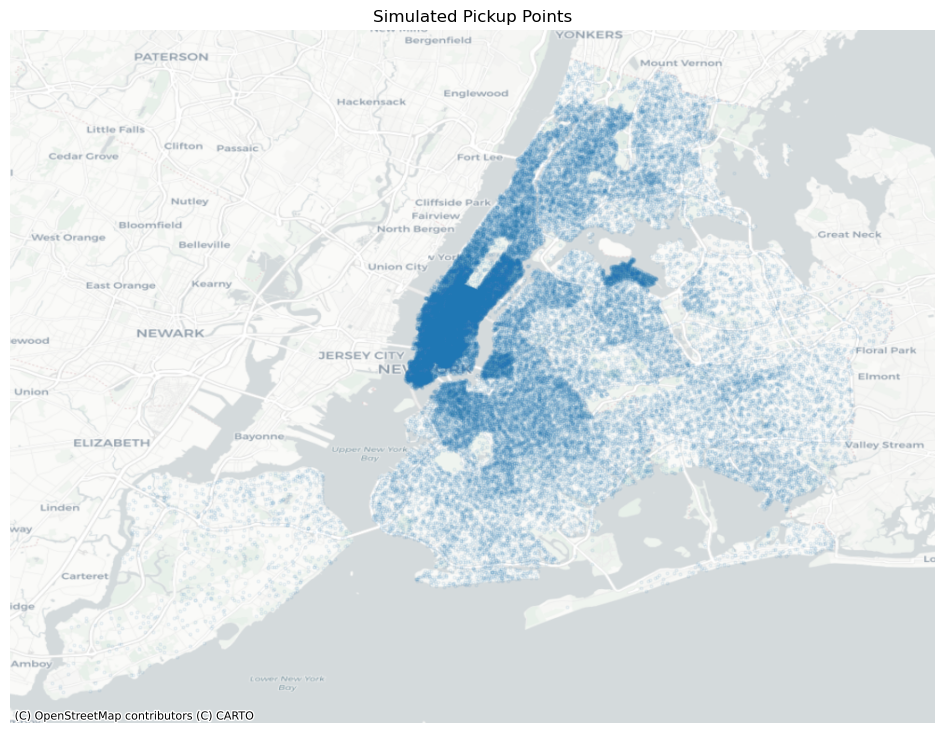

In [40]:
ax = pickup_points_gdf.plot(figsize=(12, 9), alpha=0.05, markersize=5)
ctx.add_basemap(ax, crs=pickup_points_gdf.crs.to_string(), source=ctx.providers.CartoDB.Positron)
ax.set_title("Simulated Pickup Points")
ax.axis('off');

To be sure, let use Seaborn to make a heatmap and layer it on top of the dots.

Contextily uses [Spherical Mercator](https://epsg.io/3857) projection, so we need to convert our longitude/latiude points into EPSG=3857.

In [41]:
pickup_points_gdf['x'] = pickup_points_gdf.to_crs(epsg=3857)['geometry'].apply(lambda x: x.coords[0][0])
pickup_points_gdf['y'] = pickup_points_gdf.to_crs(epsg=3857)['geometry'].apply(lambda x: x.coords[0][1])

Plot the points on top of a heatmap layer.

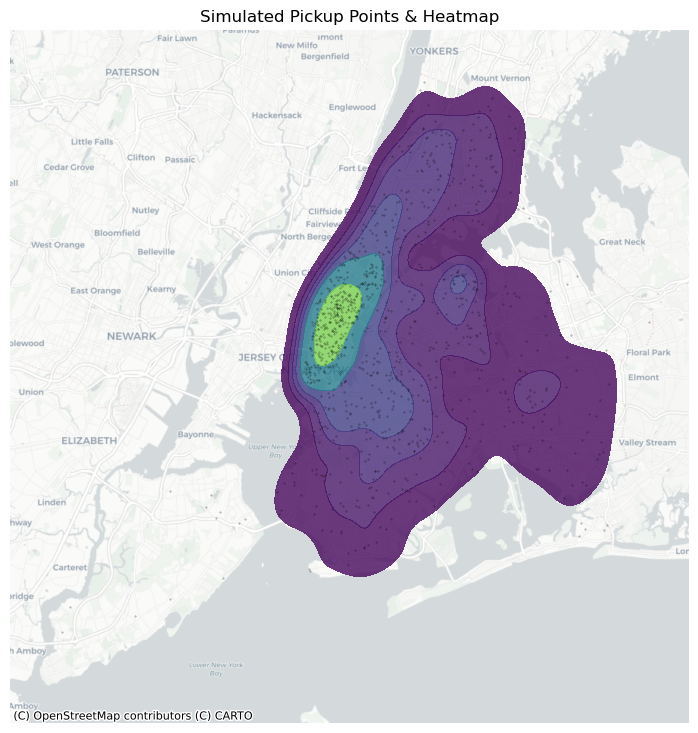

In [42]:
fig, ax = plt.subplots(figsize=(20,9))

sns.kdeplot(
    x=pickup_points_gdf['x'], 
    y=pickup_points_gdf['y'],
    n_levels=7, 
    fill=True,
    alpha=0.8, 
    cmap='viridis',
)

pickup_points_gdf.sample(1000).to_crs(epsg=3857).plot(legend=False, alpha=0.5, ax=ax, color='black',
      edgecolor='black', linewidth=1, markersize=0.1)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.set_title("Simulated Pickup Points & Heatmap")
ax.axis('off');

Notice how Midtown and Downtown Manhattan are now shown to clearly have more dense demand than central Brooklyn? That was not the case in our original map, in which bigger zones in Central Brooklyn appears to have as much or even more demand that the smaller zones in Manhattan. MAUP strikes again!

## Calulate Average Daily Pickup Density per Zone

We run into the Modifiable Areal Unit Problem when we work with pickup counts directly because the Taxi Zones are of unequal shape and size. Bigger zones will be given more credit than smaller zones. For example, Manhattan is a much more dense area of demand compared to Brooklyn. But since the Taxi Zones in Manhattan are smaller than the Taxi Zones in Brooklyn, our map (and any resulting analysis) will have downwards bias towards Manhattan and upwards bias towards Brooklyn.

To ameliorate this issue, let's normalize the data by the area of each zone. In other words, let's analyze pickup density per zone, rather than pickup counts per zone. We will define pickup density as:

$$\text{Pickup Density} = \cfrac{\text{Average Daily Number of Pickups per Zone}}{\text{Area in Square Miles per Zone}}$$

We already have the numerator, average pickups per zone. We just need to calculate the denominator: the area in square miles for each zone.

Our zones are currently projected in [WGS 84](https://epsg.io/4326), the projection associated with latitude, longitude. If we try to calcuate area from these geometries directly, they will be incorrect because this projection is not an equal-area projection (size and shape are distorted).

In [43]:
zones['geometry'].crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

So, we need to project these geometries into an appropriate projection before we calculate area. We will use the [EASE Grid](https://nsidc.org/data/user-resources/help-center/guide-ease-grids) from NASA, which has EPSG code of `6933`. The unit of measurement in this projection is meters, so when we calculate area the result will be in square meters.

In [44]:
zones['area_sq_meters'] = zones['geometry'].to_crs(6933).area

Finally, convert the area from square meters to square miles.

In [45]:
zones['area_sq_miles'] = zones['area_sq_meters'] / 2.59e+6

The total area of New York City is ~300 square miles. So let's check to make sure this looks right:

In [46]:
zones['area_sq_miles'].sum()

305.80194166163005

That looks correct. Let's confirm the square mileage of each Borough make sense as well.

In [47]:
zones.groupby('borough')[['area_sq_miles']].sum()

,area_sq_miles
borough,
Bronx,42.573190
Brooklyn,68.048288
EWR,2.835159
Manhattan,22.396911
Queens,111.723793
Staten Island,58.224601


Looks good. Now we can calculate pickup density.

In [48]:
zones['pickup_density'] = zones['avg_daily_pickups'] / zones['area_sq_miles']

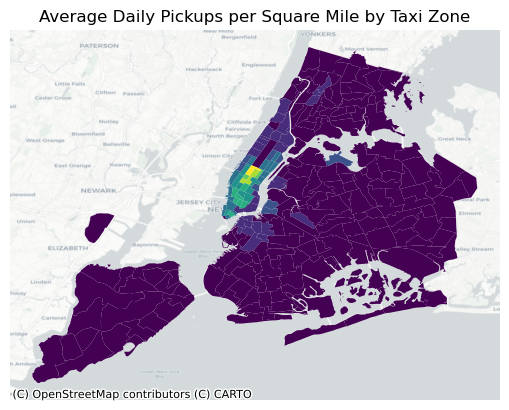

In [49]:
ax = zones.plot(column='pickup_density', legend=False, scheme='equal_interval', k=9)
ctx.add_basemap(ax, crs=zones.crs.to_string(), source=ctx.providers.CartoDB.Positron)
ax.set_title("Average Daily Pickups per Square Mile by Taxi Zone")
ax.axis('off');

Let's map the pickup density compared to the previous maps that we have made: pickup counts and the heatmap. 

Notice how the pickup density looks much more similar to the heatmap, with Midtown and Downtown Manhattan standing out as the most dense regions?

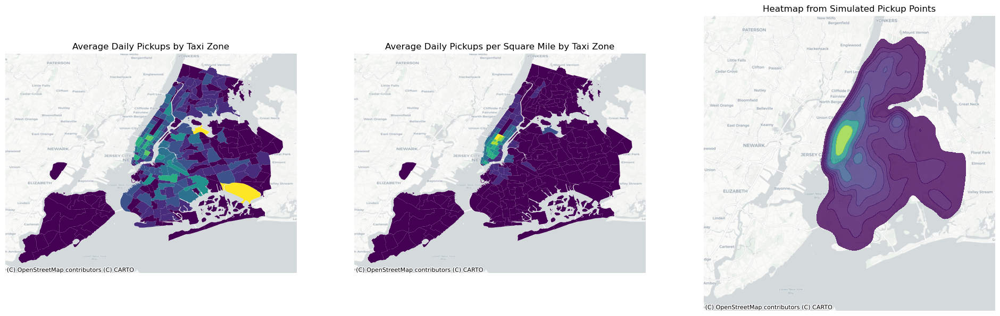

In [50]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(24,12))

# Map 1: Avg Daily Pickups
zones.plot(column='avg_daily_pickups', legend=False, ax=ax1, scheme='equal_interval', k=9)
ctx.add_basemap(ax1, crs=zones.crs.to_string(), source=ctx.providers.CartoDB.Positron)
ax1.set_title("Average Daily Pickups by Taxi Zone")
ax1.axis('off');

# Map 2: Avg Daily Pickup Density
zones.plot(column='pickup_density', legend=False, ax=ax2, scheme='equal_interval', k=9)
ctx.add_basemap(ax2, crs=zones.crs.to_string(), source=ctx.providers.CartoDB.Positron)
ax2.set_title("Average Daily Pickups per Square Mile by Taxi Zone")
ax2.axis('off')

# Map 3: Heatmap of Simulated Pickups
sns.kdeplot(
    x=pickup_points_gdf['x'], 
    y=pickup_points_gdf['y'],
    n_levels=9, 
    fill=True,
    alpha=0.8, 
    cmap='viridis',
    bw_adjust=0.8,
    ax=ax3
)
pickup_points_gdf.to_crs(epsg=3857).plot(legend=False, alpha=0, ax=ax3)
ctx.add_basemap(ax3, source=ctx.providers.CartoDB.Positron)
ax3.set_title("Heatmap from Simulated Pickup Points")
ax3.axis('off');

Looking at the density of pickups per square mile per zone is clearly a better proxy for ridehail demand than the raw count of pickups per zone.

## Choropleth Classification Schemes

Now that we've calculated pickup density, we're in a much better place to analyze the spatial distribution of demand.

However, if we simply visualize this a choroleth map, we still need to choose a color scheme to use.

As you can see below, the color scheme that you choose can have a massive impact on the results.

/Users/will/miniconda3/envs/spatialstats/lib/python3.11/site-packages/mapclassify/classifiers.py:1860: UserWarning: Numba not installed. Using slow pure python version.
  warnings.warn(


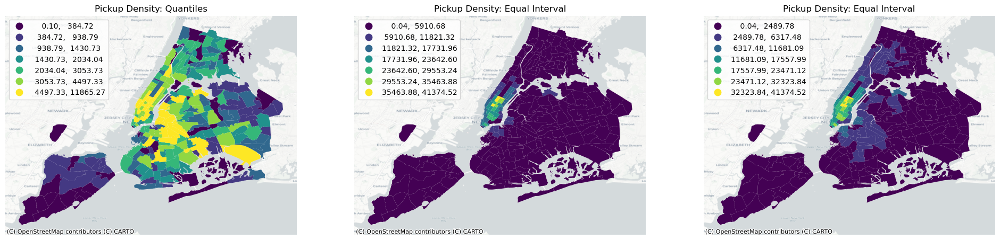

In [51]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(24,12))

# Map 1: Quantiles
zones.plot(column='avg_daily_pickups', legend=True, ax=ax1, scheme='quantiles', k=7, legend_kwds={'loc': 'upper left'})
ctx.add_basemap(ax1, crs=zones.crs.to_string(), source=ctx.providers.CartoDB.Positron)
ax1.set_title("Pickup Density: Quantiles")
ax1.axis('off');

# Map 2: Equal Interval
zones.plot(column='pickup_density', legend=True, ax=ax2, scheme='equal_interval', k=7, legend_kwds={'loc': 'upper left'})
ctx.add_basemap(ax2, crs=zones.crs.to_string(), source=ctx.providers.CartoDB.Positron)
ax2.set_title("Pickup Density: Equal Interval")
ax2.axis('off')

# Map 3: Fisher Jenks
zones.plot(column='pickup_density', legend=True, ax=ax3, scheme='fisher_jenks', k=7, legend_kwds={'loc': 'upper left'})
ctx.add_basemap(ax3, crs=zones.crs.to_string(), source=ctx.providers.CartoDB.Positron)
ax3.set_title("Pickup Density: Equal Interval")
ax3.axis('off');

Rather than making arbitrary choices regarding approprate color scheme, we can instead use statistical hypothesis testing to detect statistically significant hot spots, cold spots, diamonds and donuts. This adds value to simply visualizing the data as a choropleth map because it gives us a way to differentiate between regions of high or low values that differ significantly that what could reasonably expect to see under [complete spatial randomness](https://en.wikipedia.org/wiki/Complete_spatial_randomness). 

Below, we will test for spatial autocorrelation using the Local Moran's I statistic. But first, we need to create a spatial weights matrix to represent spatial neighbors.

## Create Spatial Weights Matrix

We will use the [libpysal](https://pysal.org/libpysal/installation.html) and [esda](https://pysal.org/esda/installation.html) libraries from the PySAL ecosysem.

Let's create a spatial weights matrix using the eight nearest neighbors. See [here](https://geographicdata.science/book/notebooks/04_spatial_weights.html) for more information about spatial weights.

In [52]:
w = libpysal.weights.KNN.from_dataframe(zones,k=8)

Let's map the spatial weights.

In [53]:
def plot_spatial_weights(w, gdf):
    import warnings
    warnings.filterwarnings("ignore")
    ax = gdf.plot(edgecolor='black', facecolor='blue',alpha=0.1, figsize=(8,8))
    f,ax = w.plot(gdf, ax=ax, 
            edge_kws=dict(color='r', linestyle=':', linewidth=1),
            node_kws=dict(marker=''))
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=gdf.crs.to_string())
    ax.set_axis_off();

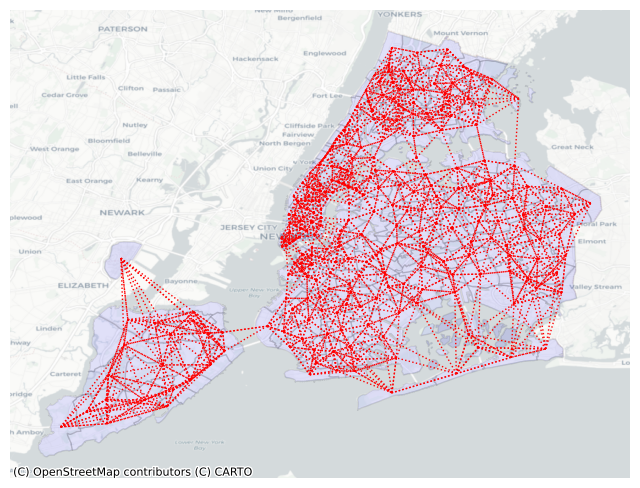

In [54]:
plot_spatial_weights(w, zones)

## Motivating Spatial Autocorrelation

Much of the text and some of code in the following sections of the notebook is sourced from the excellent [Geographic Data Science with Python](https://geographicdata.science/book/notebooks/07_local_autocorrelation.html) book by Sergio J. Rey, Dani Arribas-Bel and Levi J. Wolf. Big thanks to them for creating this amazing, free resource.

To better understand the underpinnings of local spatial autocorrelation, we will use the Moran Plot as a graphical tool. In this context, it is more intuitive to represent the data in a standardised form, as it will allow us to more easily discern a typology of spatial structure. 

Let us first calculate the `spatial lag` of our variable of interest. A `spatial lag` captures the product of values and weights for a region's neighbors. If the spatial weight is binary (as it is in our case, this will amount to the sum of the values of a regions’s neighbors; if it is row standardized, a common transformation, then is bounded between zero and one; the spatial lag thus then becomes a “local average".

In [55]:
zones["w_pickup_density"] = libpysal.weights.spatial_lag.lag_spatial(w, zones["pickup_density"])

And their respective standardized versions, where we subtract the average and divide by the standard deviation:

In [56]:
zones["pickup_density_std"] = zones["pickup_density"] - zones["pickup_density"].mean()
zones["w_pickup_density_std"] = zones["w_pickup_density"] - zones["w_pickup_density"].mean()

Technically speaking, creating a Moran Plot is very similar to creating any other scatter plot:

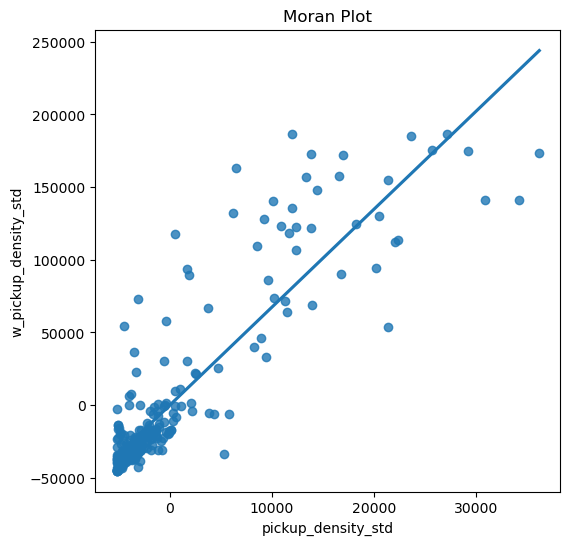

In [57]:
f, ax = plt.subplots(1, figsize=(6, 6))
sns.regplot(x="pickup_density_std", y="w_pickup_density_std", data=zones, ci=None)
ax.set_title("Moran Plot");

Using standardized values, we can immediately divide each variable (pickup density, and its spatial lag) in two groups: those with above-average pickup density, which have positive standardized values; and those with below-average pickup density, which have negative standardized values.

Applying this thinking to both the pickup density and its spatial lag, divides a Moran Plot in four quadrants. Each of them captures a situation based on whether a given area displays a value above the mean (high) or below (low) in either the original variable (pickup density) or its spatial lag.

Using this terminology, we name the four quadrants as follows: high-high (HH) for the top-right, low-high (LH) for the top-left, low-low (LL) for the bottom-left, and high-low (HL) for the bottom right. Graphically, we can capture this as follows:

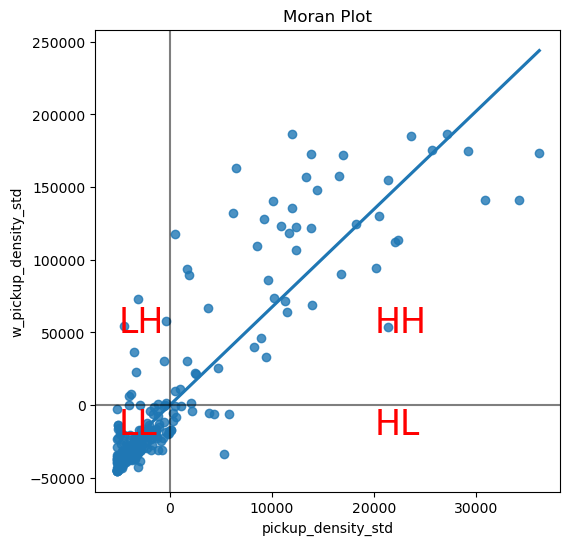

In [58]:
f, ax = plt.subplots(1, figsize=(6, 6))
sns.regplot(x="pickup_density_std", y="w_pickup_density_std", data=zones, ci=None)

# Plot for each quadrant
plt.axvline(0, c="k", alpha=0.5)
plt.axhline(0, c="k", alpha=0.5)
plt.text(20000, 50000, "HH", fontsize=25, c="r")
plt.text(20000, -20000, "HL", fontsize=25, c="r")
plt.text(-5000, 50000, "LH", fontsize=25, c="r")
plt.text(-5000, -20000, "LL", fontsize=25, c="r")
ax.set_title("Moran Plot");

Note, there is handy utility function enabling us to easily calculate the Moran's I statistic and generate a Moran plot:

In [59]:
moran = esda.moran.Moran(zones['pickup_density'], w)

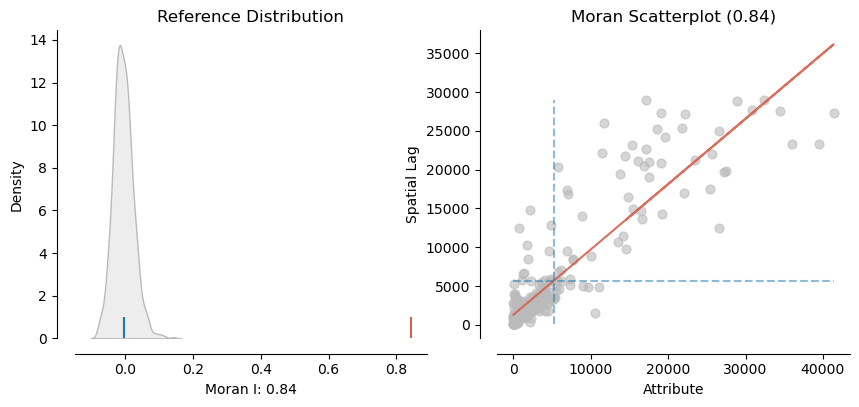

In [60]:
esdaplot.plot_moran(moran, zones);

## Local Moran's $I$

The core idea of a Local Moran’s $I_i$ is to identify cases in which the value of an observation and the average of its surroundings is either more similar (HH or LL in the scatterplot above) or dissimilar (HL, LH) than we would expect from pure chance. The mechanism to do this is similar to the one in the global Moran’s I, but applied in this case to each observation. This results in as many statistics as original observations. The formal representation of the statistic can be written as:

$$I_i = \cfrac{y_i - \bar{y}}{m_2} \sum_{j=1, j\neq i}^{n}w_{ij} (y_j - \bar{y})\ ; \ \ m_2 = \cfrac{\sum_{i}{(y_i - \bar{y})^2}}{n}$$

where $m_2$ is the second moment (variance) of the distribution of values in the data, $w_{ij}$ is the spatial weight for the pair of observations 
$i$ and $j$, and $n$ is the number of observations.

In Python, we can calculate local Moran's $I$ in a very streamlined way thanks to esda. To compute local Moran statistics, we use the Moran_Local function:

In [61]:
local_moran = esda.moran.Moran_Local(zones['pickup_density'], w)

Let's plot the Local Moran I statistics.

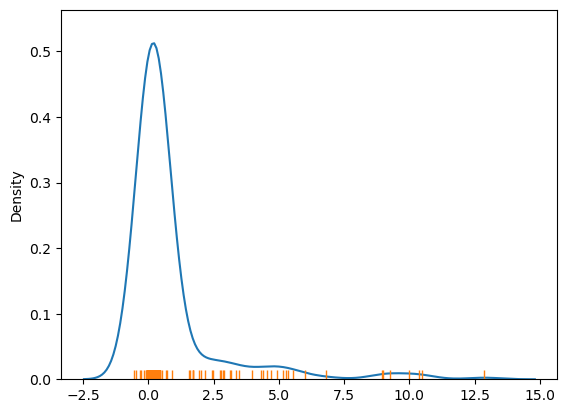

In [62]:
ax = sns.kdeplot(local_moran.Is)
sns.rugplot(local_moran.Is, ax=ax);

The figure reveals a rather skewed distribution of local Moran’s statistics. This outcome is due to the dominance of positive forms of spatial association, implying most of the local statistic values will be positive. Here it is important to keep in mind that the high positive values arise from value similarity in space, and this can be due to either high values being next to high values or low values next to low values. The local values alone cannot distinguish these two cases.

The values in the left tail of the density represent locations displaying negative spatial association. There are also two forms, a high value surrounded by low values, or a low value surrounded by high valued neighboring observations. And, again, the statistic cannot distinguish between the two cases.

Because of their very nature, looking at the numerical result of local indicators of spatial autocorrelation is not always the most useful way to exploit all the information they can provide. Remember we are calculating a statistic for every single observation in the data so, if we have many of them, it will be difficult to extract any meaningful pattern from looking at the statistics on their own. 

In this context, a choropleth can help. At first glance, this may seem to suggest that a choropleth of the values would be a useful way to visualize the spatial distribution. We can see such map in the top-left panel of the figure below and, while it tells us whether the local association is positive (HH/LL) or negative (HL/LH), it cannot tell, for example, whether the yellow areas in Manhattan are similar to the yellow areas in Staten Island. Are the two experiencing similar patterns of spatial association, or is one of them HH and the other LL? Also, we know that values around zero will not be statistically significant. Which local statistics are thus significant and which ones non-significant from a statistical point of view? In other words, which ones can be considered statistical clusters and which ones mere noise?

To answer these questions, we need to bring in additional information that we have computed when calculating the local Moran's I statistics. We do this in four acts. The first one we have already mentioned: a straighforward choropleth of the local statistic of each area. The other three include information on the quadrant each area is assigned into, whether the statistic is considered significant or not, and a combination of those two in a single so-called cluster map. A handy tool in this context is the splot library, part of the Pysal family, which provides a lightweight visualisation layer for spatial statistics:

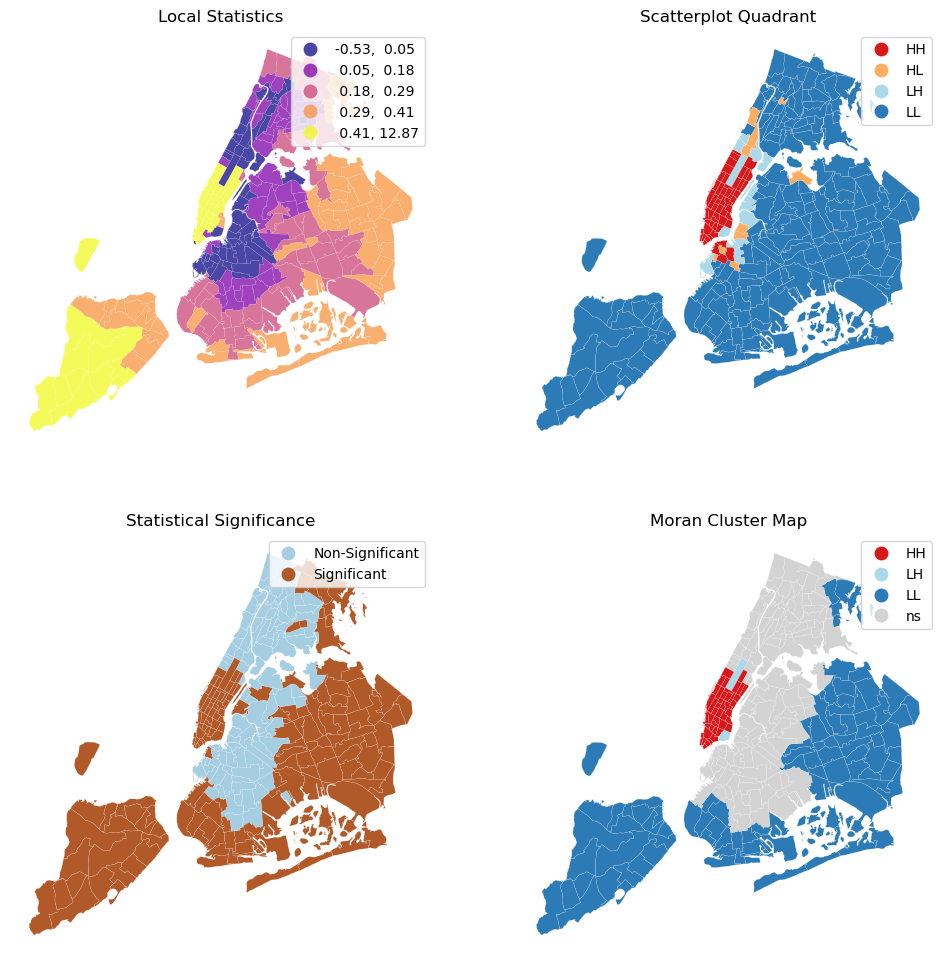

In [63]:
f, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))
axs = axs.flatten()

# Subplot 1: Choropleth of local statistics
ax = axs[0]
zones.assign(Is=local_moran.Is).plot(column="Is", cmap="plasma", scheme="quantiles", k=5, edgecolor="white", linewidth=0.1, alpha=0.75, legend=True, ax=ax)

# Subplot 2: Quadrant categories
ax = axs[1]
esdaplot.lisa_cluster(local_moran, zones.to_crs(3857), p=1, ax=ax)

# Subplot 3: Significance map (alpha=0.10)
ax = axs[2]
labels = pd.Series(1 * (local_moran.p_sim < 0.10), index=zones.index).map({1: "Significant", 0: "Non-Significant"})
zones.assign(cl=labels).plot(column="cl", categorical=True, k=2, cmap="Paired", linewidth=0.1, edgecolor="white", legend=True, ax=ax)

# Subplot 4: Cluster map
ax = axs[3]
esdaplot.lisa_cluster(local_moran, zones.to_crs(3857), p=0.05, ax=ax)

# Figure styling #
for i, ax in enumerate(axs.flatten()):
    ax.set_axis_off()
    ax.set_title(["Local Statistics","Scatterplot Quadrant","Statistical Significance","Moran Cluster Map"][i]);

There is a handy function `plot_local_autocorrelation` which will plot the Moran plot (showing significant clusters and outliers) next to the resulting Moran Cluster Map.  

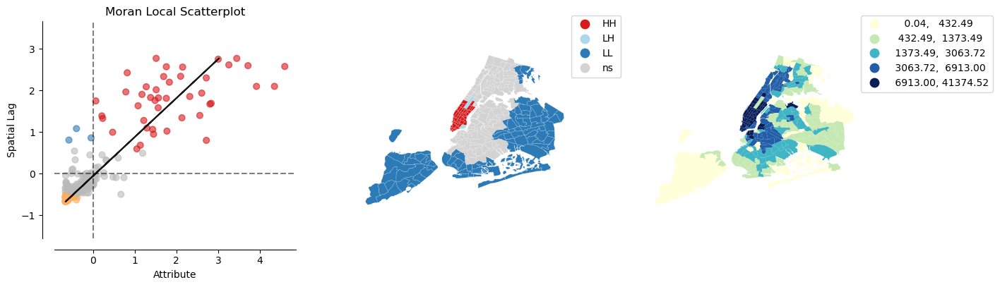

In [64]:
esdaplot.plot_local_autocorrelation(local_moran, zones, 'pickup_density', p=0.05);

## TLDR: Cluster and Outlier Analysis

Below is a straight-forward, self-contained approach to detecting clusters and outliers in pickup density among our Taxi Zones, using Local Moran's I.

In [65]:
zones[['zone', 'pickup_density', 'geometry']].head()

,zone,pickup_density,geometry
0,Newark Airport,0.035271,"POLYGON ((-74.18445 40.69500, -74.18449 40.695..."
1,Jamaica Bay,0.290584,"MULTIPOLYGON (((-73.86969 40.58231, -73.87000 ..."
2,Allerton/Pelham Gardens,1064.384765,"POLYGON ((-73.84793 40.87134, -73.84725 40.870..."
3,Alphabet City,6896.720408,"POLYGON ((-73.97177 40.72582, -73.97179 40.725..."
4,Arden Heights,88.035873,"POLYGON ((-74.17422 40.56257, -74.17349 40.562..."


In [66]:
# Create spatial weights matrix
w = libpysal.weights.KNN.from_dataframe(zones,k=8)

In [67]:
# Calculate the local Moran's I statistics and assign them
# along with their associated p-values and quadrants to each zone
local_moran = esda.moran.Moran_Local(zones['pickup_density'], w)
zones['local_moran_i'] = local_moran.Is
zones['local_moran_p_value'] = local_moran.p_sim
zones['local_moran_quadrant'] = local_moran.q

In [68]:
# Get the statistically significant clusters and outliers at alpha = 0.10
alpha = 0.10
hotspots = zones.query(f"local_moran_p_value < {alpha} & local_moran_quadrant == 1")
coldspots = zones.query(f"local_moran_p_value < {alpha} & local_moran_quadrant == 3")
doughnuts = zones.query(f"local_moran_p_value < {alpha} & local_moran_quadrant == 2")
diamonds = zones.query(f"local_moran_p_value < {alpha} & local_moran_quadrant == 4")
not_significant = zones.query(f"local_moran_p_value >= {alpha}")

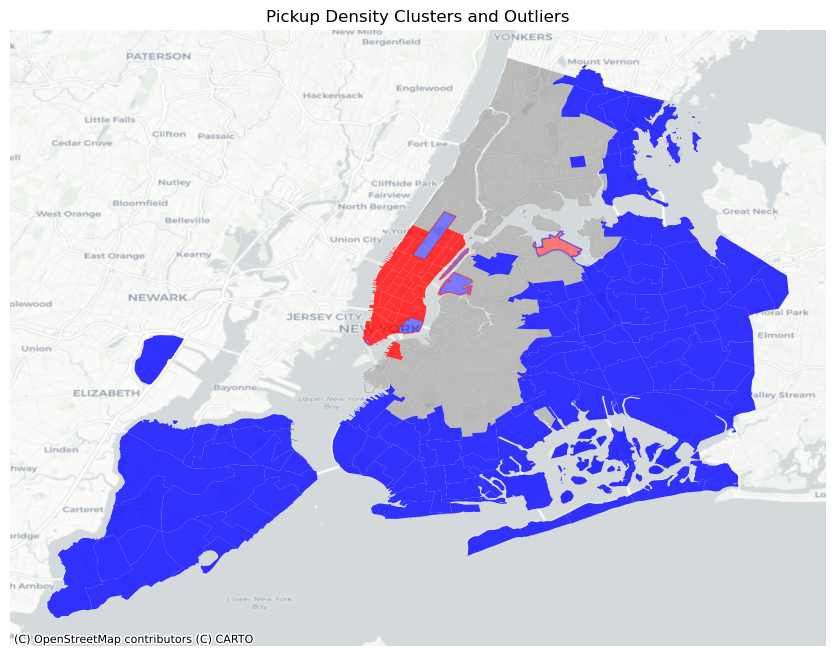

In [69]:
# Plot the hot spots, cold spots, diamonds and doughnuts.
fig, ax = plt.subplots(figsize=(16,8))
hotspots.plot(color='red',alpha=0.8, ax=ax, label='Hot Spot')
coldspots.plot(color='blue', alpha=0.8, ax=ax, label='Cold Spot')
diamonds.plot(color='red', edgecolor='blue', alpha=0.5, ax=ax, label='Diamonds')
doughnuts.plot(color='blue', edgecolor='red', alpha=0.5, ax=ax, label='Doughnuts')
not_significant.plot(color='gray', alpha=0.5, label='Not Significant', ax=ax)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=4326)
ax.set_title('Pickup Density Clusters and Outliers')
ax.axis('off');

## Next Steps: Improving Our Density Metric

Previously, we defined pickup density as:

$$\text{Pickup Density} = \cfrac{\text{Average Daily Number of Pickups per Zone}}{\text{Area in Square Miles per Zone}}$$

Can you think of any potential issues with how we are defining pickup density?

- Some Taxi Zones contain large non-driveable regions like parks and cemeteries (and are thus penalized in our current definition of Pickup Density)
- The Airport Taxi Zones are very large, but only a small fraction of those zones actually represent where users get pickup up or dropped off

Can you think of any improvements to how we are defining pickup density?

**Idea**: Rather than use the area in square miles of the entire Taxi Zone, use the cumulative length in square miles of only the driveable streets within that zone.

We can use the excellent [OSMNX](https://geoffboeing.com/2016/11/osmnx-python-street-networks/) package to get driveable street networks in NYC from OpenStreetMap.

First we need to create a convex hull around the Taxi Zones (because OSMNX `graph_from_polygon` function requires a single geometry).

In [70]:
convex_hull = zones.dissolve()['geometry'].convex_hull

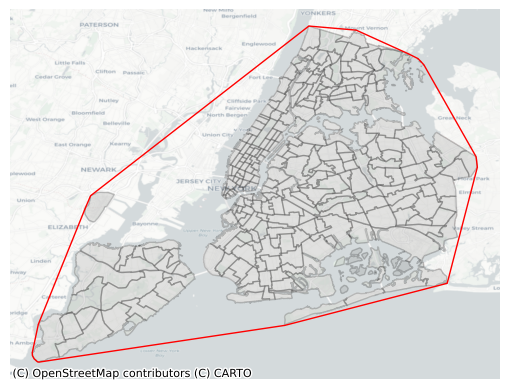

In [71]:
ax = zones.plot(color='grey', alpha=0.2, edgecolor='black')
convex_hull.plot(facecolor='none', edgecolor='red', ax=ax)
ctx.add_basemap(ax, crs=zones.crs.to_string(), source=ctx.providers.CartoDB.Positron)
ax.axis('off');

Now we call pass our Convex Hull to OSMNX to get the street network.

In [72]:
import osmnx as ox

In [73]:
%%time
G = ox.graph_from_polygon(convex_hull.iloc[0], network_type='drive')

CPU times: user 1min, sys: 1.95 s, total: 1min 2s
Wall time: 1min 4s


In [74]:
streets = ox.graph_to_gdfs(G, nodes=False, edges=True)

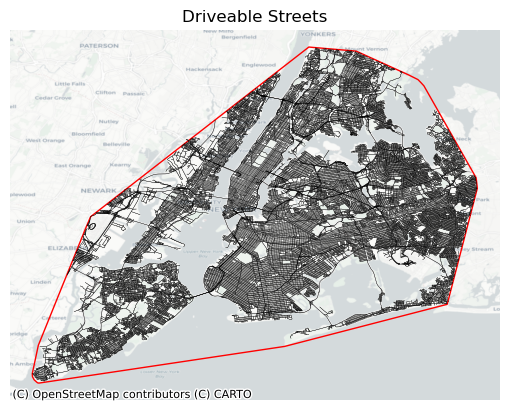

In [75]:
ax = convex_hull.plot(facecolor='none', edgecolor='red')
streets.plot(ax=ax, edgecolor='black', linewidth=0.2)
ctx.add_basemap(ax, crs=zones.crs.to_string(), source=ctx.providers.CartoDB.Positron)
ax.axis('off')
ax.set_title('Driveable Streets');

Next, we can clip the driveable streets to our Taxi Zones. This will take a while.

The GeoPandas `overlay()` function was pretty slow, so using Dask-GeoPandas to speed it up.

In [76]:
streets.shape

(166649, 16)

In [77]:
%%time
streets_clipped = gpd.overlay(streets[['geometry']], zones)

CPU times: user 14 s, sys: 290 ms, total: 14.3 s
Wall time: 14.6 s


Calculate the length of each clipped street segment in miles. Remember to use an appropriate projection like EASE Grid.

In [78]:
streets_clipped['length_meters'] = streets_clipped['geometry'].to_crs(6933).length
streets_clipped['length_miles'] = streets_clipped['length_meters'] / 1609

Finally, sum the totable driveable street length per taxi_zone.

In [79]:
street_length_per_zone = streets_clipped.groupby("location_id")['length_miles'].sum()

In [80]:
street_length_per_zone = pd.DataFrame(street_length_per_zone)
street_length_per_zone.columns=['driveable_streets_miles']

In [81]:
street_length_per_zone.head()

,driveable_streets_miles
location_id,
1,14.402656
2,3.290308
3,58.176107
4,9.738722
5,68.481528


And join the street length back to the zones DataFrame.

In [82]:
zones = pd.merge(zones, street_length_per_zone, how='left', left_on='location_id', right_index=True)

Now, we can improve our definition of Pickup Density to so that the denominator is driveable street mileage rather than total area:

$$\text{Pickup Density} = \cfrac{\text{Average Daily Number of Pickups per Zone}}{\text{Total Driveable Street Miles}}$$

In [83]:
zones['pickups_per_street_mile'] = zones['avg_daily_pickups'] / zones['driveable_streets_miles'] 

Let's re-run the local autocorrelation analysis and see if the results look different:

In [84]:
# Calculate the local Moran's I statistics, this time based on pickups per street mile
local_moran = esda.moran.Moran_Local(zones['pickups_per_street_mile'], w)
zones['local_moran_i'] = local_moran.Is
zones['local_moran_p_value'] = local_moran.p_sim
zones['local_moran_quadrant'] = local_moran.q

# Get the statistically significant clusters and outliers at alpha = 0.10
alpha = 0.10
hotspots = zones.query(f"local_moran_p_value < {alpha} & local_moran_quadrant == 1")
coldspots = zones.query(f"local_moran_p_value < {alpha} & local_moran_quadrant == 3")
doughnuts = zones.query(f"local_moran_p_value < {alpha} & local_moran_quadrant == 2")
diamonds = zones.query(f"local_moran_p_value < {alpha} & local_moran_quadrant == 4")
not_significant = zones.query(f"local_moran_p_value >= {alpha}")

The resulting map is similar to the previous one, with one major difference: JFK Airport switches from a cold spot to a diamond. This is an improvement, as JFK Airport is a known demand hotspot and it was previously being penalized for having a large Taxi Zone. Normalizing pickups by driveable street length rathern than square mileage fixed this.

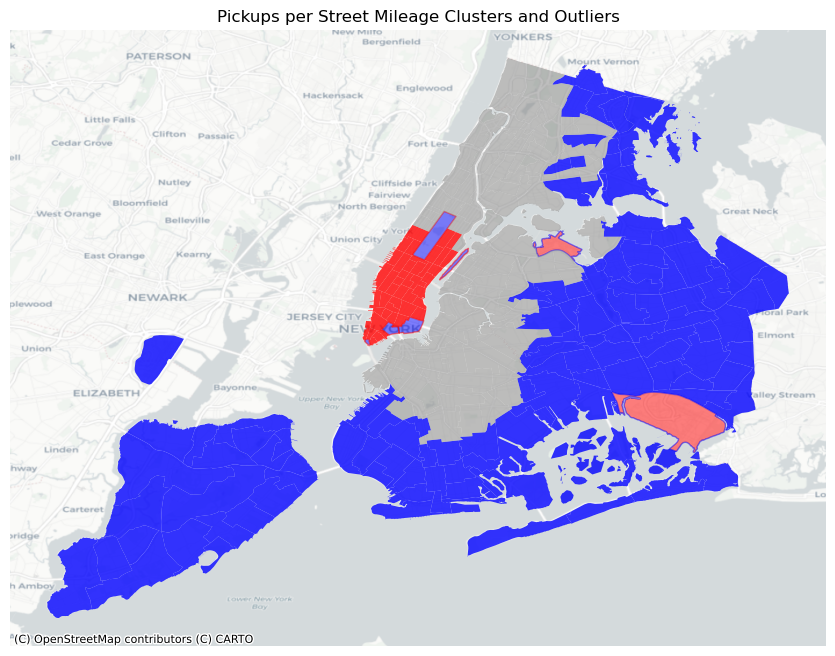

In [85]:
# Plot the hot spots, cold spots, diamonds and doughnuts.
fig, ax = plt.subplots(figsize=(16,8))
hotspots.plot(color='red',alpha=0.8, ax=ax, label='Hot Spot')
coldspots.plot(color='blue', alpha=0.8, ax=ax, label='Cold Spot')
diamonds.plot(color='red', edgecolor='blue', alpha=0.5, ax=ax, label='Diamonds')
doughnuts.plot(color='blue', edgecolor='red', alpha=0.5, ax=ax, label='Doughnuts')
not_significant.plot(color='gray', alpha=0.5, label='Not Significant', ax=ax)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=4326)
ax.set_title('Pickups per Street Mileage Clusters and Outliers')
ax.axis('off');

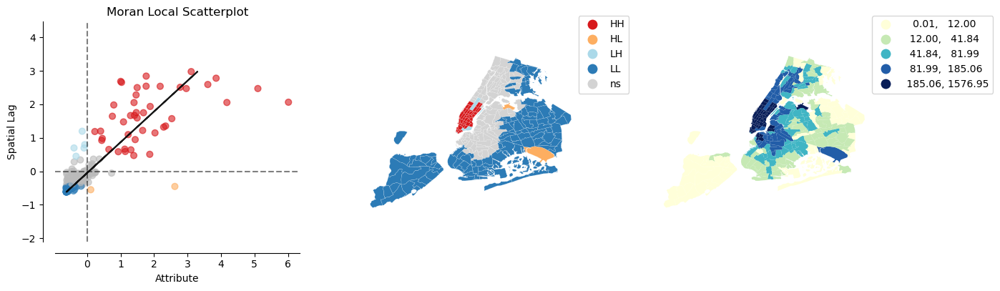

In [86]:
esdaplot.plot_local_autocorrelation(local_moran, zones, 'pickups_per_street_mile', p=0.10);